# Round-Diamond Price Prediction

#### Audhi Aprilliant

For details of competition, [**Click Here**](https://kaggle.com/c/diamonds-price/)

## 1 Importing the Modules

In [1]:
from zipfile import ZipFile           # Read zipfile
import os                             # File management
import pandas as pd                   # Dataframe manipulation
import numpy as np                    # Mathematics operation
import string                         # Alphanumeric
import seaborn as sns                 # Data visualization with seaborn
import matplotlib.pyplot as plt       # Data visualization with matplotlib

# Outlier detection
import statsmodels.api as sm
import statsmodels.formula.api as smapi

# Cross validation and data partitioning
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

# Grid-search
from sklearn.model_selection import GridSearchCV

# Evaluation metrics
from sklearn.metrics import mean_absolute_error,mean_squared_error,mean_squared_error

# Principal Component Analysis
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# Data modelling
from sklearn.linear_model import LinearRegression  # Linear regression
from sklearn.linear_model import HuberRegressor    # Robust regression with Huber weight
from sklearn.tree import DecisionTreeRegressor     # Decision Tree Regression

# Decision Tree visualization
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

# Ignore warnings
import warnings
warnings.filterwarnings('ignore',category=FutureWarning)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


## 2 Importing the Data

In [2]:
# Specifying the zip file name 
file_name = 'Datasets/diamonds-price.zip'
# Opening the zip file in READ mode 
with ZipFile(file_name,'r') as zip: 
    # printing all the contents of the zip file 
    zip.printdir()

File Name                                             Modified             Size
diamonds_test.csv                              2020-02-22 14:57:00       210203
diamonds_train.csv                             2020-02-22 14:57:00      2909478
sampleSubmission.csv                           2020-02-22 14:57:00        30722


In [3]:
# Importing the data
archive = ZipFile(file_name,'r')
train_data = pd.read_csv(archive.open('diamonds_train.csv'))
test_data = pd.read_csv(archive.open('diamonds_test.csv'))

In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
id         50000 non-null int64
price      50000 non-null int64
carat      50000 non-null float64
cut        50000 non-null object
color      50000 non-null object
clarity    50000 non-null object
depth      50000 non-null float64
table      50000 non-null float64
x          50000 non-null float64
y          50000 non-null float64
z          50000 non-null float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.2+ MB


In [5]:
print('Dimension of training data:\n{}'.format(train_data.shape[0]),
      'rows and {}'.format(train_data.shape[1]),'columns')
train_data.isna().sum()

Dimension of training data:
50000 rows and 11 columns


id         0
price      0
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
x          0
y          0
z          0
dtype: int64

In [6]:
print('Dimension of testing data:\n{}'.format(test_data.shape[0]),
      'rows and {}'.format(test_data.shape[1]),'columns')
print('The response variable is price')
test_data.isna().sum()

Dimension of testing data:
3940 rows and 10 columns
The response variable is price


id         0
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
x          0
y          0
z          0
dtype: int64

**Data Dictonary**<br>
- ***id*** - Row that represent id of the diamond
- ***price*** - Known price of diamonds
- ***carat*** - Weight of the diamond
- ***cut*** - Quality of the cut *Fair, Good, Very Good, Premium, Ideal*
- ***color*** - Diamond colour *from D (best) to J (worst)*
- ***clarity*** - A measurement of how clear the diamond is *I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best)*
- ***x*** - Length in *milimeter*
- ***y*** - Width in *milimeter*
- ***z*** - Depth in *milimeter*
- ***depth*** - Total depth percentage:<br>
    \begin{align}
    depth =2\left ( \frac{z}{x+y} \right )
    \end{align}
- ***table*** - Width of top of diamond relative to widest point

<img src='Images/Diamond Image.png'>

In [7]:
train_data.head()

,id,price,carat,cut,color,clarity,depth,table,x,y,z
0,1,2209,0.70,Very Good,G,SI1,62.8,58.0,5.64,5.69,3.56
1,2,2035,0.78,Good,J,SI1,58.0,62.0,6.01,6.05,3.50
2,3,2263,0.70,Very Good,E,SI2,61.5,60.0,5.65,5.70,3.49
3,4,15488,1.52,Ideal,E,VS2,62.4,55.0,7.42,7.32,4.60
4,5,1688,0.53,Good,F,VS1,64.2,56.0,5.11,5.14,3.29


## 3 Data Pre-processing 1

### 3.1 Dropping any columns with unusual observations

In [8]:
# Summary statistics of numerical variable
train_data.drop('id',axis=1).describe()

,price,carat,depth,table,x,y,z
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,3940.765020,0.798546,61.748402,57.461332,5.732364,5.735817,3.539637
std,3999.811184,0.474481,1.435913,2.235192,1.122570,1.145239,0.706863
min,326.000000,0.200000,43.000000,43.000000,0.000000,0.000000,0.000000
25%,950.000000,0.400000,61.000000,56.000000,4.710000,4.720000,2.910000
50%,2402.500000,0.700000,61.800000,57.000000,5.700000,5.710000,3.530000
75%,5347.000000,1.040000,62.500000,59.000000,6.540000,6.540000,4.040000
max,18823.000000,5.010000,79.000000,95.000000,10.740000,58.900000,31.800000


After doing data exploration on above summary, we know there are a few of unusual observations, especially for columns length (*X*), width (*Y*), and depth (*Z*). Those have **null-obs** that must be dropped carefully

In [9]:
train_data[(train_data['x'] == 0) | (train_data['y'] == 0) | (train_data['z'] == 0)]

,id,price,carat,cut,color,clarity,depth,table,x,y,z
3384,3653,5139,1.00,Very Good,H,VS2,63.3,53.0,0.00,0.00,0.0
6732,7254,18034,2.25,Premium,H,SI2,62.8,59.0,0.00,0.00,0.0
7860,8472,12800,1.56,Ideal,G,VS2,62.2,54.0,0.00,0.00,0.0
13502,14562,18788,2.80,Good,G,SI2,63.8,58.0,8.90,8.85,0.0
16832,18124,15686,1.20,Premium,D,VVS1,62.1,59.0,0.00,0.00,0.0
18409,19835,4954,1.07,Ideal,F,SI2,61.6,56.0,0.00,6.62,0.0
18730,20182,12631,2.18,Premium,H,SI2,59.4,61.0,8.49,8.45,0.0
21845,23568,3167,1.01,Premium,H,I1,58.1,59.0,6.66,6.60,0.0
27468,29615,15397,2.25,Premium,I,SI1,61.3,58.0,8.52,8.42,0.0
30004,32350,5564,1.15,Ideal,G,VS2,59.2,56.0,6.88,6.83,0.0


In [10]:
# Unusual data removing
train_data_clean = train_data[((train_data['x'] != 0) & (train_data['y'] != 0)) & (train_data['z'] != 0)]
train_data_clean.reset_index(drop=True)

,id,price,carat,cut,color,clarity,depth,table,x,y,z
0,1,2209,0.70,Very Good,G,SI1,62.8,58.0,5.64,5.69,3.56
1,2,2035,0.78,Good,J,SI1,58.0,62.0,6.01,6.05,3.50
2,3,2263,0.70,Very Good,E,SI2,61.5,60.0,5.65,5.70,3.49
3,4,15488,1.52,Ideal,E,VS2,62.4,55.0,7.42,7.32,4.60
4,5,1688,0.53,Good,F,VS1,64.2,56.0,5.11,5.14,3.29
...,...,...,...,...,...,...,...,...,...,...,...
49978,53935,3822,0.75,Premium,F,VVS2,62.4,57.0,5.88,5.75,3.63
49979,53936,10062,1.66,Premium,J,VVS2,62.6,59.0,7.58,7.54,4.73
49980,53937,709,0.31,Very Good,D,VS1,63.7,58.0,4.27,4.30,2.73
49981,53938,682,0.30,Good,F,VVS1,61.1,61.0,4.29,4.32,2.63


In [11]:
print('Dimension of training data after unusual observation removing:\n{}'.format(train_data_clean.shape[0]),
      'rows and {}'.format(train_data_clean.shape[1]),'columns')

Dimension of training data after unusual observation removing:
49983 rows and 11 columns


### 3.2 Calculating the ratio between length & width and volume of diamond

<div style='text-align: justify'>The length and width ratio of the diamond indicates its proportionate length and width. The length and width ratio signify how the diamond would look from the face <i>i.e.</i> top view. <b>The L/W ratio</b> gives an idea how big or small the stone will appear, also defining its shape. Diamonds with different ratios shape-up different; this ratio can make a princess cut diamond look rectangular, a heart skinny or bloated. It is important to evaluate all the shapes except round since it measures the same through out. </div>

The formula is:
    \begin{align}
    lw \ \ ratio=\frac{x}{y}
    \end{align}


[**Read more**](http://www.mysolitaire.com/knowledge-center/diamond_guide/diamond_guide_cut_diamond_length_width.html)

In [12]:
volume_diamond = (train_data_clean['x']*train_data_clean['y']*train_data_clean['z'])/3
lw_prop = train_data_clean['x']/train_data_clean['y']
train_data_clean = pd.concat([train_data_clean,
                              pd.Series(volume_diamond,name='volume'),
                              pd.Series(lw_prop,name='lw_prop')],axis=1)

### 3.3 Statistics of categorical variables

In [13]:
# Summary statistics of numerical variable
for i in train_data_clean.select_dtypes('object').columns:
    print(train_data_clean.iloc[:][i].value_counts(),'\n')

Ideal        19958
Premium      12801
Very Good    11207
Good          4526
Fair          1491
Name: cut, dtype: int64 

G    10457
E     9065
F     8812
H     7737
D     6278
I     5040
J     2594
Name: color, dtype: int64 

SI1     12132
VS2     11369
SI2      8511
VS1      7546
VVS2     4692
VVS1     3406
IF       1649
I1        678
Name: clarity, dtype: int64 



## 4 Data Visualization

### 4.1 Correlation of variables

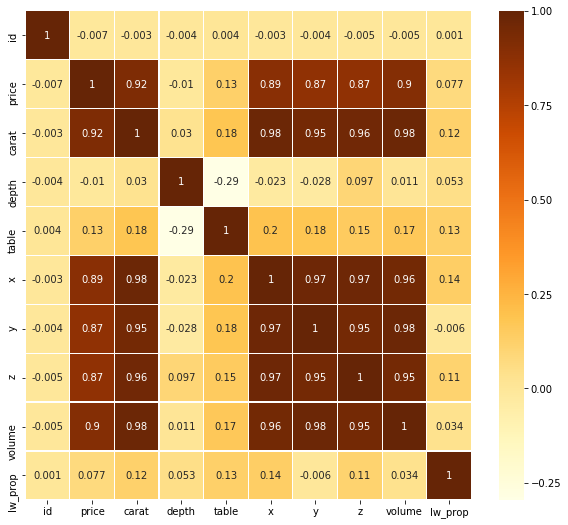

In [14]:
corrmat = train_data_clean.corr() # For calculating correlation
f,ax = plt.subplots(figsize=(10,9))
sns.heatmap(round(corrmat,3),ax=ax,cmap='YlOrBr',linewidths = 0.1,annot=True)

### 4.2 Pairplot of diamond price

In [15]:
# Listing variables that are numeric
numerical_var = list(train_data_clean.columns[train_data_clean.dtypes!=object])
numerical_var.remove('id')
numerical_var

['price', 'carat', 'depth', 'table', 'x', 'y', 'z', 'volume', 'lw_prop']

<Figure size 432x288 with 0 Axes>

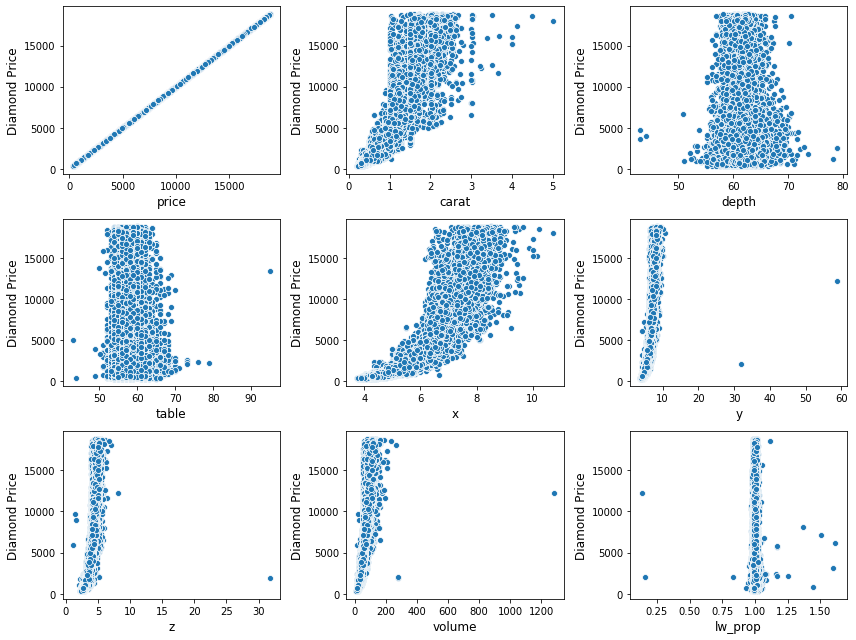

<Figure size 432x288 with 0 Axes>

In [16]:
fig,axes = plt.subplots(3,3,sharey=False) # Prepare the grids
fig.set_size_inches(12,9)                 # Set size of these grids
ax = axes.ravel()

# Create plots with looping
for i in range(len(numerical_var)):
    sns.scatterplot(x=numerical_var[i],y='price',data=train_data_clean,ax=ax[i])
    ax[i].set_xlabel(numerical_var[i],fontsize=12)
    ax[i].set_ylabel('Diamond Price',fontsize=12)

plt.tight_layout()
plt.figure()

### 4.3 Boxplot of price in cuts

In [17]:
cut_cats = ['Fair','Good','Very Good','Premium','Ideal']
data_describe_cut = pd.DataFrame()
for i in cut_cats:
    cat_describe = pd.Series(train_data_clean[train_data_clean['cut'] == i]['price'].describe(),name=i)
    data_describe_cut = pd.concat([data_describe_cut,cat_describe],axis=1,sort=False)
data_describe_cut

,Fair,Good,Very Good,Premium,Ideal
count,1491.000000,4526.000000,11207.000000,12801.000000,19958.000000
mean,4329.292421,3917.034026,3995.761667,4581.893524,3470.069847
std,3534.663116,3674.450718,3952.922824,4348.755657,3824.069658
min,337.000000,327.000000,336.000000,326.000000,326.000000
25%,2042.500000,1141.750000,912.000000,1046.000000,877.000000
50%,3278.000000,3021.000000,2649.000000,3175.000000,1813.000000
75%,5192.000000,5021.000000,5393.000000,6300.000000,4694.750000
max,18574.000000,18707.000000,18803.000000,18823.000000,18804.000000


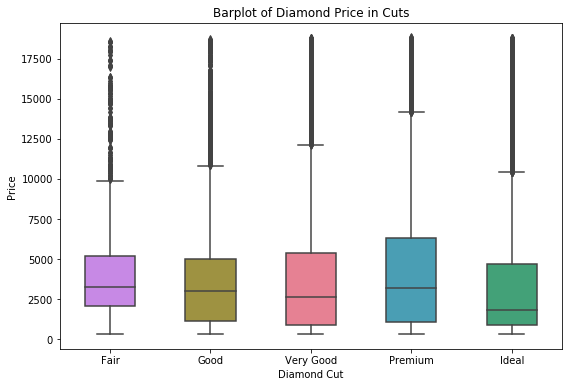

In [18]:
# Choose the size
plt.figure(figsize=(9,6))
# Create plot
fig = sns.boxplot(y='price',x='cut',hue='cut',data=train_data_clean,palette='husl',order=cut_cats,width=0.5,
                  dodge=False)
fig.get_legend().remove()                      # Remove legend
plt.xlabel('Diamond Cut')                      # Horizontal labels
plt.ylabel('Price')                            # Vertical labels
plt.title('Barplot of Diamond Price in Cuts')  # Title of figure
plt.show(fig)

### 4.4 Boxplot of diamond price in colors

In [19]:
col_cats = ['D','E','F','G','H','I','J']
data_describe_col = pd.DataFrame()
for i in col_cats:
    cat_describe = pd.Series(train_data_clean[train_data_clean['color'] == i]['price'].describe(),name=i)
    data_describe_col = pd.concat([data_describe_col,cat_describe],axis=1,sort=False)
data_describe_col

,D,E,F,G,H,I,J
count,6278.000000,9065.000000,8812.000000,10457.000000,7737.000000,5040.000000,2594.000000
mean,3172.859987,3076.052399,3739.868815,3998.957349,4493.646504,5115.625794,5299.112182
std,3345.296497,3348.053432,3803.036863,4054.509716,4222.917657,4744.239799,4441.200796
min,357.000000,326.000000,357.000000,354.000000,337.000000,334.000000,335.000000
25%,911.000000,882.000000,982.000000,932.000000,984.000000,1107.000000,1843.000000
50%,1845.000000,1736.000000,2355.500000,2235.000000,3468.000000,3733.500000,4198.500000
75%,4234.000000,3993.000000,4862.000000,6062.000000,6013.000000,7292.000000,7690.500000
max,18674.000000,18731.000000,18791.000000,18804.000000,18803.000000,18823.000000,18710.000000


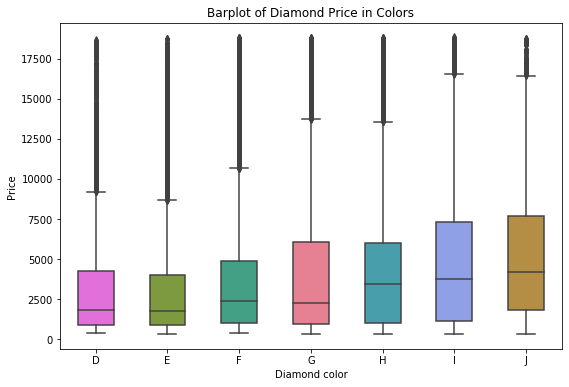

In [20]:
# Choose the size
plt.figure(figsize=(9,6))
# Create plot
fig = sns.boxplot(y='price',x='color',hue='color',data=train_data_clean,palette='husl',order=col_cats,width=0.5,
                  dodge=False)
fig.get_legend().remove()                        # Remove legend
plt.xlabel('Diamond color')                      # Horizontal labels
plt.ylabel('Price')                              # Vertical labels
plt.title('Barplot of Diamond Price in Colors')  # Title of figure
plt.show(fig)

### 4.5 Boxplot of diamond price in clarity

In [21]:
clarity_cats = ['I1','SI2','SI1','VS2','VS1','VVS2','VVS1','IF']
data_describe_clarity = pd.DataFrame()
for i in clarity_cats:
    cat_describe = pd.Series(train_data_clean[train_data_clean['clarity'] == i]['price'].describe(),name=i)
    data_describe_clarity = pd.concat([data_describe_clarity,cat_describe],axis=1,sort=False)
data_describe_clarity

,I1,SI2,SI1,VS2,VS1,VVS2,VVS1,IF
count,678.000000,8511.000000,12132.000000,11369.000000,7546.000000,4692.000000,3406.000000,1649.000000
mean,3924.632743,5065.682411,4010.327893,3918.945818,3858.428439,3296.155371,2511.402525,2883.340813
std,2852.146733,4255.960975,3816.904928,4042.359988,4030.699402,3837.989340,3328.934269,3931.390181
min,345.000000,326.000000,326.000000,334.000000,327.000000,336.000000,336.000000,369.000000
25%,2039.250000,2272.000000,1089.750000,891.000000,876.000000,792.500000,815.000000,895.000000
50%,3346.000000,4075.000000,2826.500000,2042.000000,2020.500000,1311.000000,1084.000000,1095.000000
75%,5197.750000,5776.500000,5278.000000,6027.000000,6115.000000,3705.000000,2340.500000,2399.000000
max,18531.000000,18804.000000,18803.000000,18823.000000,18780.000000,18768.000000,18777.000000,18700.000000


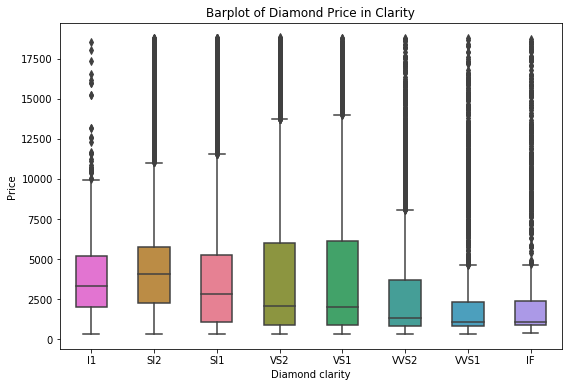

In [22]:
# Choose the size
plt.figure(figsize=(9,6))
# Create plot
fig = sns.boxplot(y='price',x='clarity',hue='clarity',data=train_data_clean,palette='husl',order=clarity_cats,
                  width=0.5,dodge=False)
fig.get_legend().remove()                           # Remove legend
plt.xlabel('Diamond clarity')                       # Horizontal labels
plt.ylabel('Price')                                 # Vertical labels
plt.title('Barplot of Diamond Price in Clarity')    # Title of figure
plt.show(fig)

## 5 Data Pre-processing 2

### 5.1 Dropping any columns which have no significant correlation to the diamond prices

The candicates are **`depth`**, **`table`**, and **`lw_prop`**

In [23]:
train_data_clean.drop(['depth','table','lw_prop'],axis=1,inplace=True)
train_data_clean.head()

,id,price,carat,cut,color,clarity,x,y,z,volume
0,1,2209,0.70,Very Good,G,SI1,5.64,5.69,3.56,38.082032
1,2,2035,0.78,Good,J,SI1,6.01,6.05,3.50,42.420583
2,3,2263,0.70,Very Good,E,SI2,5.65,5.70,3.49,37.465150
3,4,15488,1.52,Ideal,E,VS2,7.42,7.32,4.60,83.282080
4,5,1688,0.53,Good,F,VS1,5.11,5.14,3.29,28.804389


### 5.2 Dropping any outliers in scatterplot (linear regression)

The outliers need to be removed. Those outliers distracts the actual trend in scatterplot, for instance in **`volume`**

For details, [**click here**](https://gist.github.com/rnelsonchem/6693120), [**this one**](https://songhuiming.github.io/pages/2016/11/27/linear-regression-in-python-outliers-leverage-detect/), and [**the last sources**](https://www.statsmodels.org/devel/examples/notebooks/generated/robust_models_1.html)


In [24]:
# Fitting
regression = smapi.ols(formula='price~volume',data=train_data_clean).fit()
print(regression.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                 2.208e+05
Date:                Thu, 09 Apr 2020   Prob (F-statistic):               0.00
Time:                        15:34:33   Log-Likelihood:            -4.4322e+05
No. Observations:               49983   AIC:                         8.864e+05
Df Residuals:                   49981   BIC:                         8.865e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2044.7274     14.870   -137.502      0.0

In [25]:
# Bonferroni outlier test
test = regression.outlier_test()
print('Bad data points (bonf(p) < 0.05):')
test[test['bonf(p)'] < 0.05]

Bad data points (bonf(p) < 0.05):


,student_resid,unadj_p,bonf(p)
36,4.932080,8.161912e-07,4.079568e-02
87,4.958432,7.129675e-07,3.563625e-02
312,6.880602,6.030001e-12,3.013975e-07
527,5.678621,1.365363e-08,6.824495e-04
627,-5.274824,1.334353e-07,6.669496e-03
...,...,...,...
47304,5.020809,5.163075e-07,2.580660e-02
47881,-4.974262,6.571342e-07,3.284554e-02
47888,7.058863,1.700506e-12,8.499638e-08
48865,5.801397,6.616007e-09,3.306879e-04


In [26]:
# Create list for any value which is not in index
indices = list(test[test['bonf(p)'] < 0.05].index)
not_in_indices = [x for x in train_data_clean.index if x not in indices]
# Outliers removing
train_data_clean = train_data_clean.loc[not_in_indices]

In [27]:
# Listing variables those are numeric
numerical_var = list(train_data_clean.columns[train_data_clean.dtypes!=object])
numerical_var.remove('id')
numerical_var

['price', 'carat', 'x', 'y', 'z', 'volume']

<Figure size 432x288 with 0 Axes>

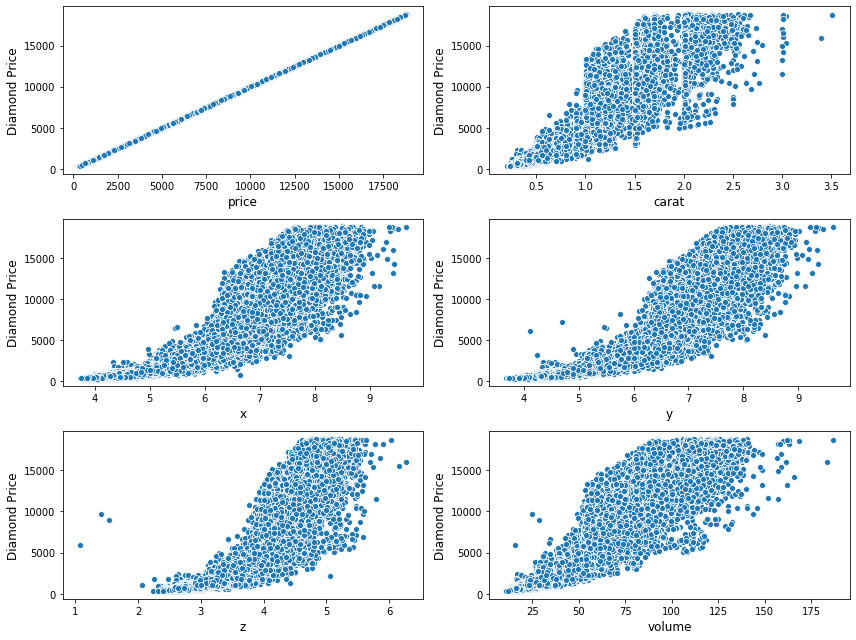

<Figure size 432x288 with 0 Axes>

In [28]:
fig,axes = plt.subplots(3,2,sharey=False) # Prepare the grids
fig.set_size_inches(12,9)                 # Set size of these grids
ax = axes.ravel()

# Create plots with looping
for i in range(len(numerical_var)):
    sns.scatterplot(x=numerical_var[i],y='price',data=train_data_clean,ax=ax[i])
    ax[i].set_xlabel(numerical_var[i],fontsize=12)
    ax[i].set_ylabel('Diamond Price',fontsize=12)

plt.tight_layout()
plt.figure()

In [29]:
# Correlation after outliers removing
train_data_clean[numerical_var][:].corr()

,price,carat,x,y,z,volume
price,1.000000,0.926832,0.889957,0.891553,0.884686,0.928688
carat,0.926832,1.000000,0.978771,0.977942,0.977247,0.999012
x,0.889957,0.978771,1.000000,0.998654,0.991087,0.979827
y,0.891553,0.977942,0.998654,1.000000,0.990704,0.979447
z,0.884686,0.977247,0.991087,0.990704,1.000000,0.976715
volume,0.928688,0.999012,0.979827,0.979447,0.976715,1.000000


In [30]:
train_data_clean.to_csv('Datasets/0 Data Clean - Diamond Price.csv',index=False)

### 5.3 Data transformation to linearize exponential trends

For details, [**Click here**](https://towardsdatascience.com/best-exponential-transformation-to-linearize-your-data-with-scipy-cca6110313a6)

**Price must be transfomed of `Exponential` in the end of prediction**

In [31]:
train_data_transform = train_data_clean.copy()
# Data transformation
train_data_transform['price'] = np.log(train_data_transform['price'])
train_data_transform['carat'] = np.log(train_data_transform['carat'])
train_data_transform['volume'] = np.log(train_data_transform['volume'])

<Figure size 432x288 with 0 Axes>

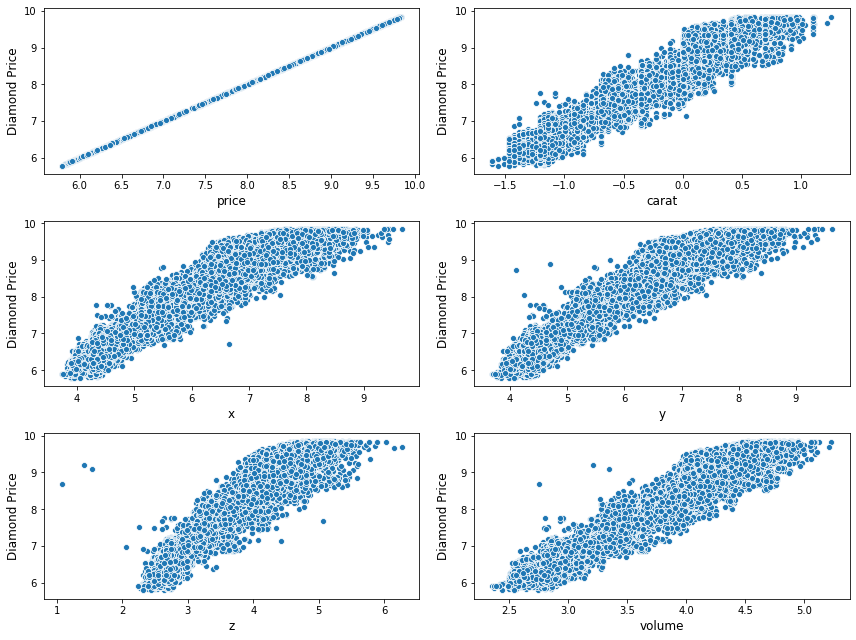

<Figure size 432x288 with 0 Axes>

In [32]:
fig,axes = plt.subplots(3,2,sharey=False) # Prepare the grids
fig.set_size_inches(12,9)                 # Set size of these grids
ax = axes.ravel()

# Create plots with looping
for i in range(len(numerical_var)):
    sns.scatterplot(x=numerical_var[i],y='price',data=train_data_transform,ax=ax[i])
    ax[i].set_xlabel(numerical_var[i],fontsize=12)
    ax[i].set_ylabel('Diamond Price',fontsize=12)

plt.tight_layout()
plt.figure()

In [33]:
# Correlation after outliers removing
train_data_transform[numerical_var][:].corr()

,price,carat,x,y,z,volume
price,1.000000,0.966717,0.961989,0.962734,0.957866,0.967382
carat,0.966717,1.000000,0.992949,0.992583,0.991838,0.999208
x,0.961989,0.992949,1.000000,0.998654,0.991087,0.994073
y,0.962734,0.992583,0.998654,1.000000,0.990704,0.994088
z,0.957866,0.991838,0.991087,0.990704,1.000000,0.991920
volume,0.967382,0.999208,0.994073,0.994088,0.991920,1.000000


In [34]:
train_data_transform.head()

,id,price,carat,cut,color,clarity,x,y,z,volume
0,1,7.700295,-0.356675,Very Good,G,SI1,5.64,5.69,3.56,3.639743
1,2,7.618251,-0.248461,Good,J,SI1,6.01,6.05,3.50,3.747634
2,3,7.724447,-0.356675,Very Good,E,SI2,5.65,5.70,3.49,3.623411
3,4,9.647821,0.418710,Ideal,E,VS2,7.42,7.32,4.60,4.422233
4,5,7.431300,-0.634878,Good,F,VS1,5.11,5.14,3.29,3.360528


In [35]:
train_data_transform.to_csv('Datasets/1 Data Clean Transformation - Diamond Price.csv',index=False)

### 5.5 Data pre-processing in testing data

In [36]:
# Create column of 'volume'
volume_diamond = (test_data['x']*test_data['y']*test_data['z'])/3
test_data = pd.concat([test_data,pd.Series(volume_diamond,name='volume')],axis=1)
test_data.head()

,id,carat,cut,color,clarity,depth,table,x,y,z,volume
0,36,0.71,Premium,G,VS1,62.4,61.0,5.70,5.65,3.54,38.001900
1,56,1.03,Ideal,H,SI1,62.0,56.0,6.44,6.49,4.01,55.866785
2,60,0.71,Ideal,D,VS2,61.0,56.0,5.76,5.81,3.53,39.377856
3,94,1.70,Very Good,J,VS2,62.9,58.0,7.55,7.59,4.76,90.923140
4,95,0.26,Very Good,G,VS1,62.1,56.0,4.07,4.11,2.54,14.162786


In [37]:
# The anomaly is also found in testing data
test_data[test_data['volume'] == 0]

,id,carat,cut,color,clarity,depth,table,x,y,z,volume
1968,26880,1.50,Good,G,I1,64.0,61.0,7.15,7.04,0.0,0.0
3484,47615,1.12,Premium,G,I1,60.4,59.0,6.71,6.67,0.0,0.0
3893,53226,1.00,Premium,G,SI2,59.1,59.0,6.55,6.48,0.0,0.0


In [38]:
# Handle anomalies data
test_data.loc[test_data['volume'] == 0,'volume'] = test_data['volume'].mean()

In [39]:
# Drop any columns of 'depth' and 'table'
test_data.drop(['depth','table'],axis=1,inplace=True)
test_data.head()

,id,carat,cut,color,clarity,x,y,z,volume
0,36,0.71,Premium,G,VS1,5.70,5.65,3.54,38.001900
1,56,1.03,Ideal,H,SI1,6.44,6.49,4.01,55.866785
2,60,0.71,Ideal,D,VS2,5.76,5.81,3.53,39.377856
3,94,1.70,Very Good,J,VS2,7.55,7.59,4.76,90.923140
4,95,0.26,Very Good,G,VS1,4.07,4.11,2.54,14.162786


In [40]:
# Data transformation
test_data['carat'] = np.log(test_data['carat'])
test_data['volume'] = np.log(test_data['volume'])
test_data.head()

,id,carat,cut,color,clarity,x,y,z,volume
0,36,-0.342490,Premium,G,VS1,5.70,5.65,3.54,3.637636
1,56,0.029559,Ideal,H,SI1,6.44,6.49,4.01,4.022970
2,60,-0.342490,Ideal,D,VS2,5.76,5.81,3.53,3.673204
3,94,0.530628,Very Good,J,VS2,7.55,7.59,4.76,4.510015
4,95,-1.347074,Very Good,G,VS1,4.07,4.11,2.54,2.650618


### 5.6 Getting dummies using One-Hot Encoding

**Training Data**

In [41]:
object_var = list(train_data_transform.loc[:,train_data_transform.dtypes == np.object].columns)
num_var = [x for x in list(train_data_transform.columns) if x not in object_var]
print('Categorical variables : ',object_var)
print('Numerical variables   : ',num_var)

Categorical variables :  ['cut', 'color', 'clarity']
Numerical variables   :  ['id', 'price', 'carat', 'x', 'y', 'z', 'volume']


In [42]:
# Create dummies
df_train_onehot = pd.DataFrame()
for i in object_var:
    df_train_onehot = pd.concat([df_train_onehot,pd.get_dummies(train_data_transform[i],prefix=i,drop_first=True)],
                                axis = 1)
# Data concatenating
df_train_final = pd.concat([train_data_transform.loc[:,num_var],df_train_onehot],axis=1)

In [43]:
df_train_final.head()

,id,price,carat,x,y,z,volume,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,1,7.700295,-0.356675,5.64,5.69,3.56,3.639743,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,2,7.618251,-0.248461,6.01,6.05,3.50,3.747634,1,0,0,...,0,0,1,0,1,0,0,0,0,0
2,3,7.724447,-0.356675,5.65,5.70,3.49,3.623411,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,4,9.647821,0.418710,7.42,7.32,4.60,4.422233,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,5,7.431300,-0.634878,5.11,5.14,3.29,3.360528,1,0,0,...,0,0,0,0,0,0,1,0,0,0


**Testing Data**

In [44]:
num_var.remove('price')

In [45]:
# Create dummies
df_test_onehot = pd.DataFrame()
for i in object_var:
    df_test_onehot = pd.concat([df_test_onehot,pd.get_dummies(test_data[i],prefix=i,drop_first=True)],axis = 1)
# Data concatenating

df_test_final = pd.concat([test_data.loc[:,num_var],df_test_onehot],axis=1)

In [46]:
df_test_final.head()

,id,carat,x,y,z,volume,cut_Good,cut_Ideal,cut_Premium,cut_Very Good,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,36,-0.342490,5.70,5.65,3.54,3.637636,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
1,56,0.029559,6.44,6.49,4.01,4.022970,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
2,60,-0.342490,5.76,5.81,3.53,3.673204,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,94,0.530628,7.55,7.59,4.76,4.510015,0,0,0,1,...,0,0,1,0,0,0,0,1,0,0
4,95,-1.347074,4.07,4.11,2.54,2.650618,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0


## 6 Data Modelling without PCA

In [47]:
# Data partitioning - training data into training and validation
df_train_final = df_train_final.reset_index(drop=True)
X = df_train_final[df_train_final.columns[~df_train_final.columns.isin(['id','price'])]]
y = df_train_final['price']
# Training = 80% and validation = 20%
X_train,X_val,y_train,y_val = train_test_split(X,y,test_size=0.2)
print('Dimension of training   :',X_train.shape)
print('Dimension of validation :',X_val.shape)

Dimension of training   : (39913, 22)
Dimension of validation : (9979, 22)


In [48]:
# Predictors of testing data
X_test = df_test_final[df_test_final.columns[~df_test_final.columns.isin(['id'])]]

In [49]:
X_train.columns

Index(['carat', 'x', 'y', 'z', 'volume', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

In [50]:
X_test.columns

Index(['carat', 'x', 'y', 'z', 'volume', 'cut_Good', 'cut_Ideal',
       'cut_Premium', 'cut_Very Good', 'color_E', 'color_F', 'color_G',
       'color_H', 'color_I', 'color_J', 'clarity_IF', 'clarity_SI1',
       'clarity_SI2', 'clarity_VS1', 'clarity_VS2', 'clarity_VVS1',
       'clarity_VVS2'],
      dtype='object')

### 6.1 Linear Regression as baseline model

In [51]:
RMSE = []
MAE = []
lm_model = LinearRegression()
cv = KFold(n_splits=10,random_state=42,shuffle=True)
i = 0
for train_index, test_index in cv.split(X_train):
    i += 1
    X_training,X_testing,y_training,y_testing = X_train.iloc[train_index],X_train.iloc[test_index],\
                                                y_train.iloc[train_index],y_train.iloc[test_index]
    # Fitting the model
    lm_model.fit(X_training,y_training)
    # Predicting the price
    y_pred = lm_model.predict(X_testing)
    # Evaluation
    RMSE_val = np.sqrt(mean_squared_error(np.exp(y_pred),np.exp(y_testing)))
    MAE_val = mean_absolute_error(np.exp(y_pred),np.exp(y_testing))
    RMSE.append(RMSE_val)
    MAE.append(MAE_val)
    print(f'RMSE in CV - {i}: {round(RMSE_val,6)}',f'and MAE: {round(MAE_val,6)}')
print('Average of RMSE: {}'.format(sum(RMSE)/len(RMSE)))
print('Average of MAE: {}'.format(sum(MAE)/len(MAE)))

RMSE in CV - 1: 863.798825 and MAE: 398.559199
RMSE in CV - 2: 775.668128 and MAE: 390.730545
RMSE in CV - 3: 758.528152 and MAE: 387.369067
RMSE in CV - 4: 836.743084 and MAE: 427.036549
RMSE in CV - 5: 770.74293 and MAE: 388.903226
RMSE in CV - 6: 740.590432 and MAE: 385.159147
RMSE in CV - 7: 725.344789 and MAE: 381.84152
RMSE in CV - 8: 805.146617 and MAE: 409.92947
RMSE in CV - 9: 817.719734 and MAE: 398.914247
RMSE in CV - 10: 845.62485 and MAE: 413.861878
Average of RMSE: 793.9907540922226
Average of MAE: 398.2304848759217


In [52]:
print('Intercept:',lm_model.intercept_)
pd.DataFrame({'Variable':X.columns,'Intercept':lm_model.coef_})

Intercept: 6.828323374469083


,Variable,Intercept
0,carat,1.596525
1,x,0.109823
2,y,-0.039869
3,z,0.045944
4,volume,0.100239
5,cut_Good,0.083104
6,cut_Ideal,0.158971
7,cut_Premium,0.135379
8,cut_Very Good,0.117299
9,color_E,-0.052643


In [53]:
# Fitting the model
lm_model.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [54]:
# Predict training data and validation data
y_pred_train = lm_model.predict(X_train)
y_pred_val = lm_model.predict(X_val)

In [55]:
# Model evaluation - training data
RMSE_train_linreg_no_pca = np.sqrt(mean_squared_error(np.exp(y_pred_train),np.exp(y_train)))
MAE_train_linreg_no_pca = mean_absolute_error(np.exp(y_pred_train),np.exp(y_train))
corr_train_linreg_no_pca = np.corrcoef(np.exp(y_pred_train),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_linreg_no_pca = np.sqrt(mean_squared_error(np.exp(y_pred_val),np.exp(y_val)))
MAE_test_linreg_no_pca = mean_absolute_error(np.exp(y_pred_val),np.exp(y_val))
corr_test_linreg_no_pca = np.corrcoef(np.exp(y_pred_val),np.exp(y_val))[0,1]

print('RMSE for training data                  :{}'.format(RMSE_train_linreg_no_pca))
print('RMSE for testing data                   :{}'.format(RMSE_test_linreg_no_pca))
print('MAE for training data                   :{}'.format(MAE_train_linreg_no_pca))
print('MAE for testing data                    :{}'.format(MAE_test_linreg_no_pca))
print('Pearson Correlation for training data   :{}'.format(corr_train_linreg_no_pca))
print('Pearson Correlation for testing data    :{}'.format(corr_test_linreg_no_pca))

RMSE for training data                  :794.2850765232274
RMSE for testing data                   :770.6553426139569
MAE for training data                   :397.8366617650197
MAE for testing data                    :396.44547847973854
Pearson Correlation for training data   :0.9801381688040517
Pearson Correlation for testing data    :0.9808977601295261


Text(0.5, 1.0, 'Linear Regression - Training No PCA')

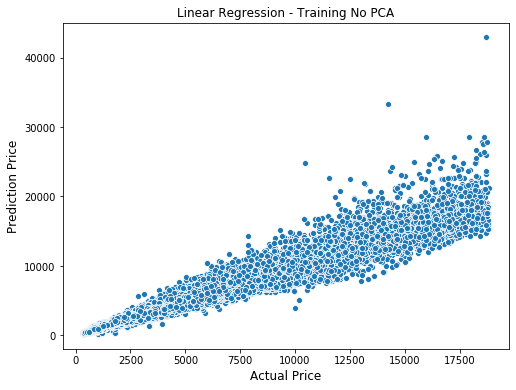

In [56]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(y_pred_train))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Linear Regression - Training No PCA')

Text(0.5, 1.0, 'Linear Regression - Testing No PCA')

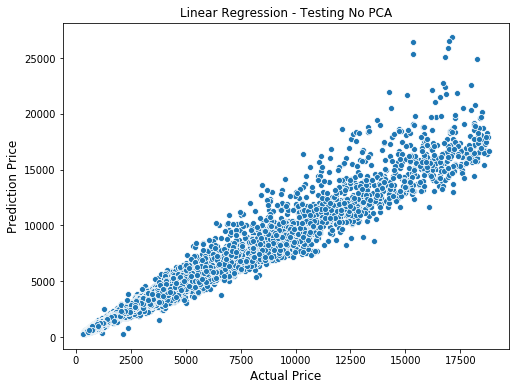

In [57]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(y_pred_val))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Linear Regression - Testing No PCA')

In [58]:
# Predict testing data
y_pred_test = lm_model.predict(X_test)
y_pred_test = np.exp(y_pred_test)

In [59]:
pred_linreg_no_pca = pd.DataFrame({'id':df_test_final.id,'price':y_pred_test})
pred_linreg_no_pca.head()

,id,price
0,36,2948.054085
1,56,4471.593151
2,60,3318.994540
3,94,10005.183836
4,95,447.596036


### 6.2 Decision Tree

#### 6.2.1 Baseline Tree-based model

In [60]:
tree_model = DecisionTreeRegressor(random_state = 0)
tree_model.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [61]:
# Model evaluation - training data
RMSE_train_dc_baseline = np.sqrt(mean_squared_error(np.exp(tree_model.predict(X_train)),np.exp(y_train)))
MAE_train_dc_baseline = mean_absolute_error(np.exp(tree_model.predict(X_train)),np.exp(y_train))
corr_train_dc_baseline = np.corrcoef(np.exp(tree_model.predict(X_train)),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_dc_baseline = np.sqrt(mean_squared_error(np.exp(tree_model.predict(X_val)),np.exp(y_val)))
MAE_test_dc_baseline = mean_absolute_error(np.exp(tree_model.predict(X_val)),np.exp(y_val))
corr_test_dc_baseline = np.corrcoef(np.exp(tree_model.predict(X_val)),np.exp(y_val))[0,1]

print('RMSE for training data                  :{}'.format(RMSE_train_dc_baseline))
print('RMSE for testing data                   :{}'.format(RMSE_test_dc_baseline))
print('MAE for training data                   :{}'.format(MAE_train_dc_baseline))
print('MAE for testing data                    :{}'.format(MAE_test_dc_baseline))
print('Pearson Correlation for training data   :{}'.format(corr_train_dc_baseline))
print('Pearson Correlation for testing data    :{}'.format(corr_test_dc_baseline))

RMSE for training data                  :14.05301954993346
RMSE for testing data                   :871.1629852048318
MAE for training data                   :1.0124085751381446
MAE for testing data                    :384.4133798062022
Pearson Correlation for training data   :0.9999937458404927
Pearson Correlation for testing data    :0.9755194103681964


Text(0.5, 1.0, 'Decision Tree Baseline - Training No PCA')

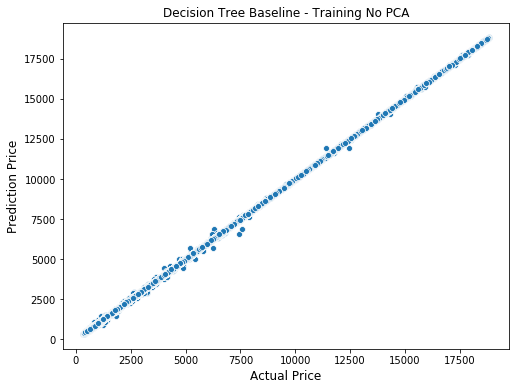

In [62]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(tree_model.predict(X_train)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree Baseline - Training No PCA')

Text(0.5, 1.0, 'Decision Tree Baseline - Testing No PCA')

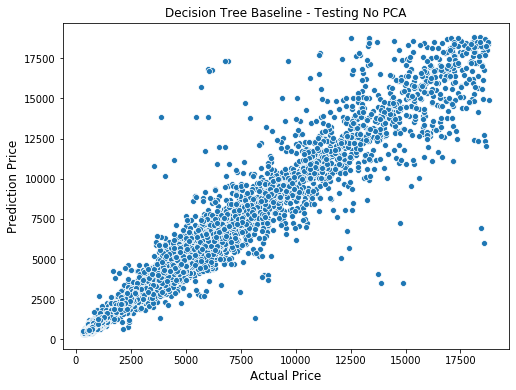

In [63]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(tree_model.predict(X_val)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree Baseline - Testing No PCA')

#### 6.2.2 Choosing **`max_depth`** for Decision Tree Regression

In [64]:
# 10-fold cross validation
kfold = KFold(n_splits=10)
# List that contains metric evaluation of RMSE
train_score = []
val_score = []
# Choose max_depth using looping
depth_range = range(5,50)
for depth in depth_range:
    tree = DecisionTreeRegressor(max_depth=depth)
    tree.fit(X_train,y_train)
    # Save the score of RMSE
    train_score.append(np.sqrt(mean_squared_error(np.exp(tree.predict(X_train)),np.exp(y_train))))
    val_score.append(np.sqrt(mean_squared_error(np.exp(tree.predict(X_val)),np.exp(y_val))))

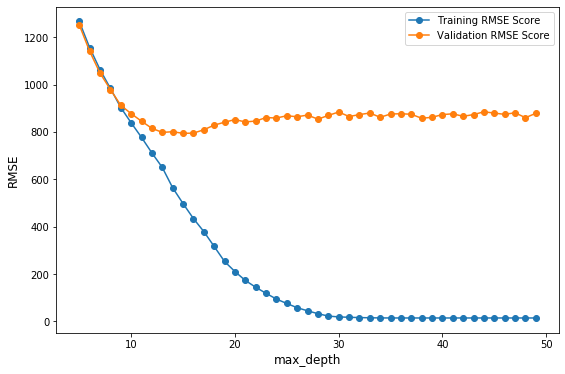

In [65]:
# Show evaluation scores of looping
plt.figure(figsize=(9,6))
# Show scores in one window
plt.plot(depth_range,train_score,'o-')
plt.plot(depth_range,val_score,'o-')
# Show the legends
plt.legend(['Training RMSE Score','Validation RMSE Score'])
# Determine label for horizontal axis
plt.xlabel('max_depth',fontsize=12)
# Determine label for vertical axis
plt.ylabel('RMSE',fontsize=12)
# Show the plot
plt.show()

#### 6.2.3 Choosing **`max_depth`** and **`min_split`** for Decision Tree Regression

In [66]:
# Hyperparameters
max_depth = [int(x) for x in np.linspace(10,30,num=10)]
max_depth.append(None)
min_samples_split = [2,50,75,100,120,150]
min_samples_leaf = [2,50,75,100,120,150]

# parmeter yang disiapkan digabung dalam satu objek
param_grid = {'max_depth':max_depth
             ,'min_samples_split':min_samples_split
             ,'min_samples_leaf':min_samples_leaf}

In [67]:
# Model of Decision Tree Regression
tree = DecisionTreeRegressor()
# Conduct 10-fold CV
kfold = KFold(n_splits=10,random_state=42)
# Grid-search
grid_search_tree = GridSearchCV(tree, # Model
                                param_grid = param_grid, # Hyperparameters
                                scoring = ['neg_mean_absolute_error','neg_root_mean_squared_error'], # Scores
                                refit = 'neg_root_mean_squared_error', # Specific score for tunning
                                cv = kfold, # Cross validation method
                                return_train_score = True) # Return any scores in training data CV

In [68]:
# Hyperparameters tunning with training data
grid_search_tree.fit(X_train,y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [10, 12, 14, 16, 18, 21, 23, 25, 27, 30,
              

In [69]:
# Show scores in fitting models
pd.DataFrame(grid_search_tree.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,...,split2_train_neg_root_mean_squared_error,split3_train_neg_root_mean_squared_error,split4_train_neg_root_mean_squared_error,split5_train_neg_root_mean_squared_error,split6_train_neg_root_mean_squared_error,split7_train_neg_root_mean_squared_error,split8_train_neg_root_mean_squared_error,split9_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,0.326479,0.011839,0.005694,0.000282,10,2,2,"{'max_depth': 10, 'min_samples_leaf': 2, 'min_...",-0.113011,-0.112705,...,-0.151161,-0.151130,-0.151285,-0.153334,-0.151296,-0.152619,-0.152624,-0.151964,-0.151900,0.000712
1,0.310739,0.000545,0.005452,0.000088,10,2,50,"{'max_depth': 10, 'min_samples_leaf': 2, 'min_...",-0.112415,-0.113304,...,-0.153858,-0.153733,-0.153826,-0.155615,-0.154491,-0.154742,-0.155504,-0.154300,-0.154481,0.000624
2,0.308353,0.002859,0.005400,0.000046,10,2,75,"{'max_depth': 10, 'min_samples_leaf': 2, 'min_...",-0.112624,-0.114362,...,-0.154784,-0.155499,-0.155375,-0.157595,-0.155821,-0.156769,-0.156625,-0.156129,-0.156046,0.000756
3,0.305928,0.001852,0.005448,0.000094,10,2,100,"{'max_depth': 10, 'min_samples_leaf': 2, 'min_...",-0.112982,-0.115731,...,-0.155764,-0.156614,-0.156502,-0.158550,-0.156746,-0.157751,-0.157395,-0.157545,-0.157079,0.000735
4,0.306438,0.004127,0.005504,0.000247,10,2,120,"{'max_depth': 10, 'min_samples_leaf': 2, 'min_...",-0.113609,-0.116174,...,-0.156411,-0.157405,-0.156852,-0.159210,-0.157167,-0.158963,-0.158077,-0.158253,-0.157788,0.000854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.296405,0.002566,0.005545,0.000218,None,150,50,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.125128,-0.130339,...,-0.172278,-0.173039,-0.173947,-0.172770,-0.174591,-0.175908,-0.173813,-0.174992,-0.173871,0.001239
392,0.297408,0.001371,0.005642,0.000308,None,150,75,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.125128,-0.130339,...,-0.172278,-0.173039,-0.173947,-0.172770,-0.174591,-0.175908,-0.173813,-0.174992,-0.173871,0.001239
393,0.296855,0.001457,0.005613,0.000246,None,150,100,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.125128,-0.130339,...,-0.172278,-0.173039,-0.173947,-0.172770,-0.174591,-0.175908,-0.173813,-0.174992,-0.173871,0.001239
394,0.296408,0.001960,0.005592,0.000224,None,150,120,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.125128,-0.130339,...,-0.172278,-0.173039,-0.173947,-0.172770,-0.174591,-0.175908,-0.173813,-0.174992,-0.173871,0.001239


In [70]:
# Best model
print('Best hyperparameters : \n',grid_search_tree.best_params_,'\n')
print('Best evaluation : \n',grid_search_tree.best_score_,'\n')
print('Best model of Decision Tree: \n',grid_search_tree.best_estimator_,'\n')

Best hyperparameters : 
 {'max_depth': 25, 'min_samples_leaf': 2, 'min_samples_split': 50} 

Best evaluation : 
 -0.12910873494378156 

Best model of Decision Tree: 
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=25,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=2, min_samples_split=50,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best') 



#### 6.2.4 Final model of Decision Tree Regression

In [71]:
# model akhir berdasarkan fungsi GridSearchCV
tree_final = grid_search_tree.best_estimator_
tree_final.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=25,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=2, min_samples_split=50,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [72]:
# Model evaluation - training data
RMSE_train_dc_no_pca = np.sqrt(mean_squared_error(np.exp(tree_final.predict(X_train)),np.exp(y_train)))
MAE_train_dc_no_pca = mean_absolute_error(np.exp(tree_final.predict(X_train)),np.exp(y_train))
corr_train_dc_no_pca = np.corrcoef(np.exp(tree_final.predict(X_train)),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_dc_no_pca = np.sqrt(mean_squared_error(np.exp(tree_final.predict(X_val)),np.exp(y_val)))
MAE_test_dc_no_pca = mean_absolute_error(np.exp(tree_final.predict(X_val)),np.exp(y_val))
corr_test_dc_no_pca = np.corrcoef(np.exp(tree_final.predict(X_val)),np.exp(y_val))[0,1]

print('RMSE for training data  :{}'.format(RMSE_train_dc_no_pca))
print('RMSE for testing data   :{}'.format(RMSE_test_dc_no_pca))
print('MAE for training data   :{}'.format(MAE_train_dc_no_pca))
print('MAE for testing data    :{}'.format(MAE_test_dc_no_pca))
print('Pearson Correlation for training data   :{}'.format(corr_train_dc_no_pca))
print('Pearson Correlation for testing data    :{}'.format(corr_test_dc_no_pca))

RMSE for training data  :613.4502520122945
RMSE for testing data   :743.8447432252444
MAE for training data   :292.2294018107157
MAE for testing data    :344.5083419875194
Pearson Correlation for training data   :0.9880511927615866
Pearson Correlation for testing data    :0.9820602555926288


Text(0.5, 1.0, 'Decision Tree - Training No PCA')

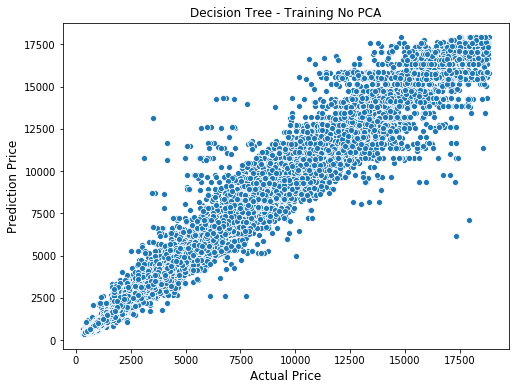

In [73]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(tree_final.predict(X_train)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree - Training No PCA')

Text(0.5, 1.0, 'Decision Tree - Testing No PCA')

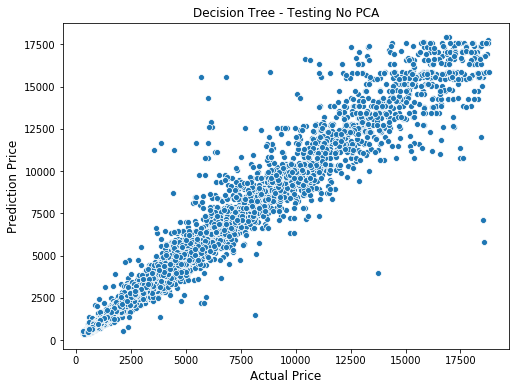

In [74]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(tree_final.predict(X_val)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree - Testing No PCA')

#### 6.2.5 Visualization of Decision Tree Regression

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.414059 to fit



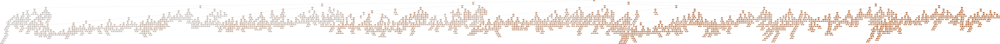

In [75]:
dot_data = StringIO()
export_graphviz(tree_final,out_file=dot_data,filled=True,rounded=True,special_characters=True,
                feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Above tree unluckily **can't interpret** due to its complexity

In [76]:
# Predict testing data
y_pred_test = tree_final.predict(X_test)
y_pred_test = np.exp(y_pred_test)

In [77]:
pred_tree_no_pca = pd.DataFrame({'id':df_test_final.id,'price':y_pred_test})
pred_tree_no_pca.head()

,id,price
0,36,2809.748113
1,56,4912.813250
2,60,3530.809113
3,94,8624.018407
4,95,425.530253


## 7 Data Modelling with PCA

### 7.1 *Principal Component Analysis*

In [78]:
object_var = list(train_data_transform.loc[:,train_data_transform.dtypes == np.object].columns)
num_var = [x for x in list(train_data_transform.columns) if x not in object_var]
num_var.remove('id')
num_var.remove('price')
print('Categorical variables : ',object_var)
print('Numerical variables   : ',num_var)

Categorical variables :  ['cut', 'color', 'clarity']
Numerical variables   :  ['carat', 'x', 'y', 'z', 'volume']


#### 7.1.1 Min-max Scaler

In [79]:
# Min-max scaler
scaler = MinMaxScaler()
scaler.fit(df_train_final[num_var])

MinMaxScaler(copy=True, feature_range=(0, 1))

#### 7.1.2 PCA of training data

In [80]:
len(df_train_final['price'])

49892

In [81]:
# Min-max scaler of training data
df_scaled_train = scaler.transform(df_train_final[num_var])
df_scaled_train = pd.DataFrame(df_scaled_train,columns = num_var)
df_scaled_train = pd.concat([df_scaled_train,pd.Series(df_train_final['price']).reset_index(drop=True)],axis=1)
df_scaled_train.head()

,carat,x,y,z,volume,price
0,0.437256,0.322091,0.337815,0.478846,0.446140,7.700295
1,0.475027,0.384486,0.398319,0.467308,0.483693,7.618251
2,0.437256,0.323777,0.339496,0.465385,0.440456,7.724447
3,0.707892,0.622260,0.611765,0.678846,0.718495,9.647821
4,0.340154,0.232715,0.245378,0.426923,0.348957,7.431300


In [82]:
df_scaled_train.describe()

,carat,x,y,z,volume,price
count,49892.000000,49892.000000,49892.000000,49892.000000,49892.000000,49892.000000
mean,0.423491,0.337236,0.344812,0.474649,0.432503,7.784217
std,0.203888,0.188436,0.186471,0.132775,0.201240,1.013458
min,0.000000,0.000000,0.000000,0.000000,0.000000,5.786897
25%,0.241932,0.165261,0.174790,0.353846,0.250419,6.854355
50%,0.437256,0.332209,0.341176,0.473077,0.447853,7.782390
75%,0.575437,0.473862,0.478992,0.569231,0.586028,8.579088
max,1.000000,1.000000,1.000000,1.000000,1.000000,9.842835


In [83]:
# Determine whether it would belong to X or y
X = df_scaled_train[num_var]
y = df_scaled_train['price']
# Principal Component Analysis with n = 10
pca = PCA(n_components=5)
pca.fit(X)
X_pca = pca.transform(X)
X_pca

array([[ 4.73351280e-03, -2.46005055e-02, -1.55313984e-03,
        -6.42772825e-03, -2.77360760e-04],
       [ 9.39483586e-02,  4.64058581e-03,  3.95144065e-02,
        -2.86064880e-03,  2.91302751e-03],
       [-8.33855082e-04, -2.00121431e-02,  1.03726352e-02,
        -4.51662656e-03,  4.33436178e-03],
       ...,
       [-5.38506654e-01,  7.13462068e-03, -1.88613613e-02,
        -1.17426287e-03,  4.65058653e-03],
       [-5.52042177e-01,  2.14799129e-02, -3.74449030e-03,
        -3.70088405e-04,  5.21945020e-03],
       [ 6.02241127e-01,  1.63181255e-02, -4.13737029e-03,
         2.49428332e-03, -1.73746027e-04]])

In [84]:
# Explained variance ratio of PCA
np.sum(pca.explained_variance_ratio_)

0.9999999999999999

In [85]:
df_pca_train = pd.DataFrame(X_pca,columns=['pc'+str(i) for i in range(1,6)])
df_pca_train['price'] = y
df_pca_train.head()

,pc1,pc2,pc3,pc4,pc5,price
0,0.004734,-0.024601,-0.001553,-0.006428,-0.000277,7.700295
1,0.093948,0.004641,0.039514,-0.002861,0.002913,7.618251
2,-0.000834,-0.020012,0.010373,-0.004517,0.004334,7.724447
3,0.596999,0.012353,-0.013955,0.008967,-0.006255,9.647821
4,-0.190116,-0.026267,-0.012814,-0.003952,-0.000770,7.431300


In [86]:
# Pearson correlation
corrmat = df_pca_train.corr() # For calculating correlation
round(corrmat,2)

,pc1,pc2,pc3,pc4,pc5,price
pc1,1.00,0.00,-0.00,0.00,0.00,0.97
pc2,0.00,1.00,0.00,-0.00,0.00,-0.04
pc3,-0.00,0.00,1.00,0.00,-0.00,0.03
pc4,0.00,-0.00,0.00,1.00,0.00,-0.02
pc5,0.00,0.00,-0.00,0.00,1.00,-0.01
price,0.97,-0.04,0.03,-0.02,-0.01,1.00


#### 7.1.3 PCA of testing data

In [87]:
# Min-max scaler of testing data
df_scaled_test = scaler.transform(df_test_final[num_var])
df_scaled_test = pd.DataFrame(df_scaled_test,columns = num_var)
df_scaled_test.head()

,carat,x,y,z,volume
0,0.442207,0.332209,0.331092,0.475000,0.445407
1,0.572065,0.456998,0.472269,0.565385,0.579527
2,0.442207,0.342327,0.357983,0.473077,0.457787
3,0.746955,0.644182,0.657143,0.709615,0.749049
4,0.091574,0.057336,0.072269,0.282692,0.101864


In [88]:
df_scaled_test.describe()

,carat,x,y,z,volume
count,3940.000000,3940.000000,3940.000000,3940.000000,3940.000000
mean,0.421212,0.334882,0.342545,0.472551,0.430201
std,0.202699,0.187430,0.185209,0.132833,0.199958
min,0.000000,0.015177,0.016807,-0.205769,0.025228
25%,0.241932,0.166948,0.176471,0.353846,0.251643
50%,0.437256,0.328836,0.337815,0.469231,0.445780
75%,0.575437,0.470489,0.478992,0.569231,0.584255
max,0.957769,0.932546,0.936134,0.944231,0.955446


In [89]:
# Determine whether it would belong to X or y
X = df_scaled_test
# PCA
X_pca = pca.transform(X)
X_pca

array([[ 7.17457874e-03, -2.51259681e-02,  2.82449092e-03,
         6.29811974e-03, -2.13166182e-05],
       [ 2.86852115e-01, -1.33822890e-02,  2.21333099e-03,
        -6.55611680e-03,  7.69765224e-04],
       [ 2.93925987e-02, -1.06291981e-02,  1.24880013e-02,
        -6.91670360e-03, -3.28172047e-03],
       ...,
       [ 2.75170756e-01, -7.44964063e-03,  1.18879325e-02,
         4.24581552e-03, -1.81458908e-03],
       [ 4.06499001e-01,  1.62204678e-02,  1.76256249e-02,
        -1.15540656e-02, -4.42779105e-03],
       [-4.95378002e-01,  2.53243929e-02,  5.30177103e-03,
         4.30522728e-03, -4.00053462e-03]])

In [90]:
df_pca_test = pd.DataFrame(X_pca,columns=['pc'+str(i) for i in range(1,6)])
df_pca_test.head()

,pc1,pc2,pc3,pc4,pc5
0,0.007175,-0.025126,0.002824,0.006298,-0.000021
1,0.286852,-0.013382,0.002213,-0.006556,0.000770
2,0.029393,-0.010629,0.012488,-0.006917,-0.003282
3,0.671673,0.013190,-0.020946,-0.005533,0.004226
4,-0.638577,0.030436,-0.015116,-0.001781,0.004828


### 7.2 Data Partitioning

In [91]:
# Data partitioning - training data into training and validation
df_pca_train = df_pca_train.reset_index(drop=True)
X = df_pca_train[df_pca_train.columns[~df_pca_train.columns.isin(['price'])]]
y = df_pca_train['price']
# Training = 80% and validation = 20%
X_train,X_val,y_train,y_val = train_test_split(X,y,test_size=0.2)
print('Dimension of training   :',X_train.shape)
print('Dimension of validation :',X_val.shape)

Dimension of training   : (39913, 5)
Dimension of validation : (9979, 5)


In [92]:
# Predictors of testing data
X_test = df_pca_test

### 7.3 Linear regression as baseline model

In [93]:
RMSE = []
MAE = []
lm_model = LinearRegression()
cv = KFold(n_splits=10,random_state=42,shuffle=True)
i = 0
for train_index,test_index in cv.split(X_train):
    i += 1
    X_training,X_testing,y_training,y_testing = X_train.iloc[train_index],X_train.iloc[test_index],\
                                                y_train.iloc[train_index],y_train.iloc[test_index]
    # Fitting the model
    lm_model.fit(X_training,y_training)
    # Predicting the price
    y_pred = lm_model.predict(X_testing)
    # Evaluation
    RMSE_val = np.sqrt(mean_squared_error(np.exp(y_pred),np.exp(y_testing)))
    MAE_val = mean_absolute_error(np.exp(y_pred),np.exp(y_testing))
    RMSE.append(RMSE_val)
    MAE.append(MAE_val)
    print(f'RMSE in CV - {i}: {round(RMSE_val,6)}',f'and MAE: {round(MAE_val,6)}')
print('Average of RMSE: {}'.format(sum(RMSE)/len(RMSE)))
print('Average of MAE: {}'.format(sum(MAE)/len(MAE)))

RMSE in CV - 1: 1483.007732 and MAE: 798.371614
RMSE in CV - 2: 1490.998503 and MAE: 820.315377
RMSE in CV - 3: 1490.908626 and MAE: 804.923186
RMSE in CV - 4: 1460.589345 and MAE: 799.93589
RMSE in CV - 5: 1436.228031 and MAE: 789.582015
RMSE in CV - 6: 1504.373261 and MAE: 813.389262
RMSE in CV - 7: 1461.152953 and MAE: 796.458163
RMSE in CV - 8: 1482.937151 and MAE: 794.288148
RMSE in CV - 9: 1509.140532 and MAE: 811.377494
RMSE in CV - 10: 1453.227115 and MAE: 811.82431
Average of RMSE: 1477.2563248469
Average of MAE: 804.0465459525738


In [94]:
print('Intercept:',lm_model.intercept_)
pd.DataFrame({'Variable':X.columns,'Intercept':lm_model.coef_})

Intercept: 7.783651075291098


,Variable,Intercept
0,pc1,2.379836
1,pc2,-1.721726
2,pc3,2.253712
3,pc4,-2.555499
4,pc5,-1.148976


In [95]:
# Fitting the model
lm_model.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [96]:
# Predict training data and validation data
y_pred_train = lm_model.predict(X_train)
y_pred_val = lm_model.predict(X_val)

In [97]:
# Model evaluation - training data
RMSE_train_linreg_pca = np.sqrt(mean_squared_error(np.exp(y_pred_train),np.exp(y_train)))
MAE_train_linreg_pca = mean_absolute_error(np.exp(y_pred_train),np.exp(y_train))
corr_train_linreg_pca = np.corrcoef(np.exp(y_pred_train),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_linreg_pca = np.sqrt(mean_squared_error(np.exp(y_pred_val),np.exp(y_val)))
MAE_test_linreg_pca = mean_absolute_error(np.exp(y_pred_val),np.exp(y_val))
corr_test_linreg_pca = np.corrcoef(np.exp(y_pred_val),np.exp(y_val))[0,1]

print('RMSE for training data                  :{}'.format(RMSE_train_linreg_pca))
print('RMSE for testing data                   :{}'.format(RMSE_test_linreg_pca))
print('MAE for training data                   :{}'.format(MAE_train_linreg_pca))
print('MAE for testing data                    :{}'.format(MAE_test_linreg_pca))
print('Pearson Correlation for training data   :{}'.format(corr_train_linreg_pca))
print('Pearson Correlation for testing data    :{}'.format(corr_test_linreg_pca))

RMSE for training data                  :1476.9862199879633
RMSE for testing data                   :1507.3011745513256
MAE for training data                   :803.904328059227
MAE for testing data                    :818.4266740787573
Pearson Correlation for training data   :0.9291855765450937
Pearson Correlation for testing data    :0.9257046160783172


Text(0.5, 1.0, 'Linear Regression - Training PCA')

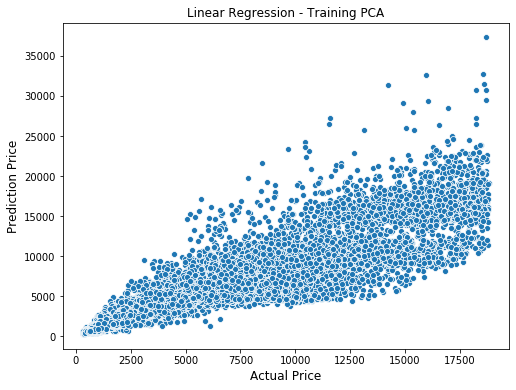

In [98]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(y_pred_train))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Linear Regression - Training PCA')

Text(0.5, 1.0, 'Linear Regression - Testing PCA')

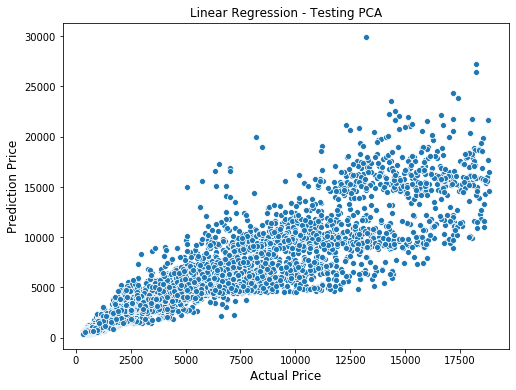

In [99]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(y_pred_val))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Linear Regression - Testing PCA')

In [100]:
# Predict testing data
y_pred_test = lm_model.predict(X_test)
y_pred_test = np.exp(y_pred_test)

In [101]:
pred_linreg_pca = pd.DataFrame({'id':df_test_final.id,'price':y_pred_test})
pred_linreg_pca.head()

,id,price
0,36,2527.131394
1,56,4966.049559
2,60,2754.453597
3,94,11196.965209
4,95,481.991040


### 7.4 Decision Tree

#### 7.4.1 Baseline tree-based model

In [102]:
tree_model = DecisionTreeRegressor(random_state = 0)
tree_model.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [103]:
# Model evaluation - training data
RMSE_train_dc_baseline_pca = np.sqrt(mean_squared_error(np.exp(tree_model.predict(X_train)),np.exp(y_train)))
MAE_train_dc_baseline_pca = mean_absolute_error(np.exp(tree_model.predict(X_train)),np.exp(y_train))
corr_train_dc_baseline_pca = np.corrcoef(np.exp(tree_model.predict(X_train)),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_dc_baseline_pca = np.sqrt(mean_squared_error(np.exp(tree_model.predict(X_val)),np.exp(y_val)))
MAE_test_dc_baseline_pca = mean_absolute_error(np.exp(tree_model.predict(X_val)),np.exp(y_val))
corr_test_dc_baseline_pca = np.corrcoef(np.exp(tree_model.predict(X_val)),np.exp(y_val))[0,1]

print('RMSE for training data                  :{}'.format(RMSE_train_dc_baseline_pca))
print('RMSE for testing data                   :{}'.format(RMSE_test_dc_baseline_pca))
print('MAE for training data                   :{}'.format(MAE_train_dc_baseline_pca))
print('MAE for testing data                    :{}'.format(MAE_test_dc_baseline_pca))
print('Pearson Correlation for training data   :{}'.format(corr_train_dc_baseline_pca))
print('Pearson Correlation for testing data    :{}'.format(corr_test_dc_baseline_pca))

RMSE for training data                  :256.2841843294863
RMSE for testing data                   :1827.026779364638
MAE for training data                   :64.28058019977246
MAE for testing data                    :1020.8454758190003
Pearson Correlation for training data   :0.9979148753339295
Pearson Correlation for testing data    :0.8933927076385603


Text(0.5, 1.0, 'Decision Tree Baseline - Training PCA')

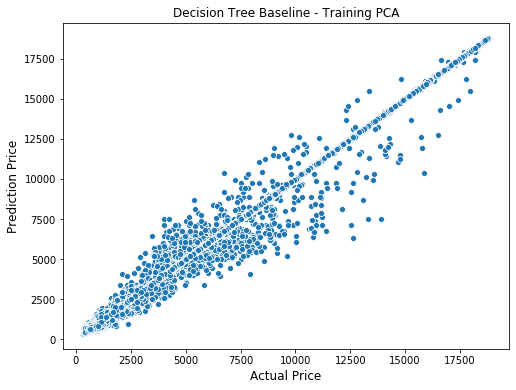

In [104]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(tree_model.predict(X_train)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree Baseline - Training PCA')

Text(0.5, 1.0, 'Decision Tree Baseline - Testing PCA')

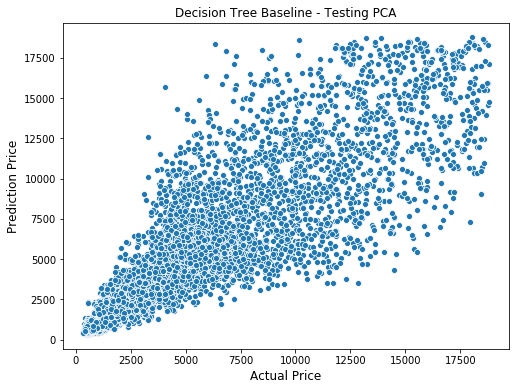

In [105]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(tree_model.predict(X_val)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree Baseline - Testing PCA')

#### 7.4.2 Choosing **`max_depth`** for Decision Tree Regression

In [106]:
# 10-fold cross validation
kfold = KFold(n_splits=10)
# List that contains metric evaluation of RMSE
train_score = []
val_score = []
# Choose max_depth using looping
depth_range = range(5,50)
for depth in depth_range:
    tree = DecisionTreeRegressor(max_depth=depth)
    tree.fit(X_train,y_train)
    # Save the score of RMSE
    train_score.append(np.sqrt(mean_squared_error(np.exp(tree.predict(X_train)),np.exp(y_train))))
    val_score.append(np.sqrt(mean_squared_error(np.exp(tree.predict(X_val)),np.exp(y_val))))

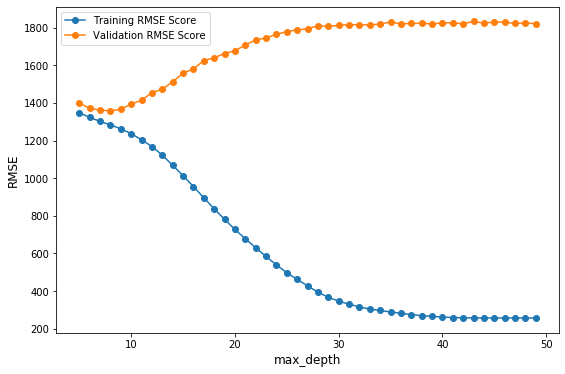

In [107]:
# Show evaluation scores of looping
plt.figure(figsize=(9,6))
# Show scores in one window
plt.plot(depth_range,train_score,'o-')
plt.plot(depth_range,val_score,'o-')
# Show the legends
plt.legend(['Training RMSE Score','Validation RMSE Score'])
# Determine label for horizontal axis
plt.xlabel('max_depth',fontsize=12)
# Determine label for vertical axis
plt.ylabel('RMSE',fontsize=12)
# Show the plot
plt.show()

#### 7.4.3 Choosing **`max_depth`** and **`min_split`** for Decision Tree Regression

In [108]:
# Hyperparameters
max_depth = [int(x) for x in np.linspace(30,50,num=15)]
max_depth.append(None)
min_samples_split = [2,50,75,100,120,150]
min_samples_leaf = [2,50,75,100,120,150]

# parmeter yang disiapkan digabung dalam satu objek
param_grid = {'max_depth':max_depth
             ,'min_samples_split':min_samples_split
             ,'min_samples_leaf':min_samples_leaf}

In [109]:
# Model of Decision Tree Regression
tree = DecisionTreeRegressor()
# Conduct 10-fold CV
kfold = KFold(n_splits=10,random_state=42)
# Grid-search
grid_search_tree = GridSearchCV(tree, # Model
                                param_grid = param_grid, # Hyperparameters
                                scoring = ['neg_mean_absolute_error','neg_root_mean_squared_error'], # Scores
                                refit = 'neg_root_mean_squared_error', # Specific score for tunning
                                cv = kfold, # Cross validation method
                                return_train_score = True) # Return any scores in training data CV

In [110]:
# Hyperparameters tunning with training data
grid_search_tree.fit(X_train,y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [30, 31, 32, 34, 35, 37, 38, 40, 41, 42,
              

In [111]:
# Show scores in fitting models
pd.DataFrame(grid_search_tree.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_neg_mean_absolute_error,split1_test_neg_mean_absolute_error,...,split2_train_neg_root_mean_squared_error,split3_train_neg_root_mean_squared_error,split4_train_neg_root_mean_squared_error,split5_train_neg_root_mean_squared_error,split6_train_neg_root_mean_squared_error,split7_train_neg_root_mean_squared_error,split8_train_neg_root_mean_squared_error,split9_train_neg_root_mean_squared_error,mean_train_neg_root_mean_squared_error,std_train_neg_root_mean_squared_error
0,0.593013,0.012084,0.010564,0.011577,30,2,2,"{'max_depth': 30, 'min_samples_leaf': 2, 'min_...",-0.235856,-0.232438,...,-0.115330,-0.117668,-0.116481,-0.116967,-0.114811,-0.116893,-0.113920,-0.116599,-0.116190,0.001250
1,0.485204,0.004728,0.005206,0.000114,30,2,50,"{'max_depth': 30, 'min_samples_leaf': 2, 'min_...",-0.199475,-0.197137,...,-0.198888,-0.199929,-0.198600,-0.198699,-0.198096,-0.198717,-0.198013,-0.198158,-0.198570,0.000548
2,0.467211,0.010988,0.005067,0.000018,30,2,75,"{'max_depth': 30, 'min_samples_leaf': 2, 'min_...",-0.195972,-0.192709,...,-0.207113,-0.207249,-0.206449,-0.208010,-0.206575,-0.207287,-0.206039,-0.205881,-0.206835,0.000619
3,0.463001,0.010024,0.005260,0.000315,30,2,100,"{'max_depth': 30, 'min_samples_leaf': 2, 'min_...",-0.192581,-0.189456,...,-0.211719,-0.211686,-0.210968,-0.212500,-0.210941,-0.212138,-0.211274,-0.211252,-0.211614,0.000498
4,0.446395,0.004106,0.005098,0.000196,30,2,120,"{'max_depth': 30, 'min_samples_leaf': 2, 'min_...",-0.190905,-0.188190,...,-0.214631,-0.214195,-0.213541,-0.215170,-0.213410,-0.214767,-0.214245,-0.213870,-0.214370,0.000592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
571,0.293485,0.003685,0.004594,0.000069,None,150,50,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.187015,-0.183226,...,-0.231097,-0.230523,-0.230058,-0.231491,-0.230358,-0.230605,-0.230222,-0.230335,-0.230648,0.000423
572,0.293122,0.003832,0.004575,0.000016,None,150,75,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.187015,-0.183226,...,-0.231097,-0.230523,-0.230058,-0.231491,-0.230358,-0.230605,-0.230222,-0.230335,-0.230648,0.000423
573,0.291756,0.002043,0.004608,0.000034,None,150,100,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.187015,-0.183226,...,-0.231097,-0.230523,-0.230058,-0.231491,-0.230358,-0.230605,-0.230222,-0.230335,-0.230648,0.000423
574,0.292776,0.003092,0.004573,0.000018,None,150,120,"{'max_depth': None, 'min_samples_leaf': 150, '...",-0.187015,-0.183226,...,-0.231097,-0.230523,-0.230058,-0.231491,-0.230358,-0.230605,-0.230222,-0.230335,-0.230648,0.000423


In [112]:
# Best model
print('Best hyperparameters : \n',grid_search_tree.best_params_,'\n')
print('Best evaluation : \n',grid_search_tree.best_score_,'\n')
print('Best model of Decision Tree: \n',grid_search_tree.best_estimator_,'\n')

Best hyperparameters : 
 {'max_depth': 41, 'min_samples_leaf': 120, 'min_samples_split': 75} 

Best evaluation : 
 -0.23693011965735294 

Best model of Decision Tree: 
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=41,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=120, min_samples_split=75,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best') 



#### 7.4.4 Final model of Decision Tree Regression

In [113]:
# model akhir berdasarkan fungsi GridSearchCV
tree_final = grid_search_tree.best_estimator_
tree_final.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=41,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=120, min_samples_split=75,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [114]:
# Model evaluation - training data
RMSE_train_dc_pca = np.sqrt(mean_squared_error(np.exp(tree_final.predict(X_train)),np.exp(y_train)))
MAE_train_dc_pca = mean_absolute_error(np.exp(tree_final.predict(X_train)),np.exp(y_train))
corr_train_dc_pca = np.corrcoef(np.exp(tree_final.predict(X_train)),np.exp(y_train))[0,1]
# Model evaluation - testing data
RMSE_test_dc_pca = np.sqrt(mean_squared_error(np.exp(tree_final.predict(X_val)),np.exp(y_val)))
MAE_test_dc_pca = mean_absolute_error(np.exp(tree_final.predict(X_val)),np.exp(y_val))
corr_test_dc_pca = np.corrcoef(np.exp(tree_final.predict(X_val)),np.exp(y_val))[0,1]

print('RMSE for training data                  :{}'.format(RMSE_train_dc_pca))
print('RMSE for testing data                   :{}'.format(RMSE_test_dc_pca))
print('MAE for training data                   :{}'.format(MAE_train_dc_pca))
print('MAE for testing data                    :{}'.format(MAE_test_dc_pca))
print('Pearson Correlation for training data   :{}'.format(corr_train_dc_pca))
print('Pearson Correlation for testing data    :{}'.format(corr_test_dc_pca))

RMSE for training data                  :1294.5336844542476
RMSE for testing data                   :1366.1469623464295
MAE for training data                   :732.4063564327837
MAE for testing data                    :766.0494883427278
Pearson Correlation for training data   :0.9460458982308667
Pearson Correlation for testing data    :0.9392146942653146


Text(0.5, 1.0, 'Decision Tree - Training PCA')

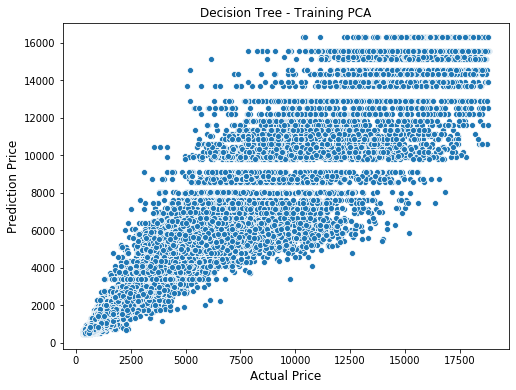

In [119]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_train),y=np.exp(tree_final.predict(X_train)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree - Training PCA')

Text(0.5, 1.0, 'Decision Tree - Testing PCA')

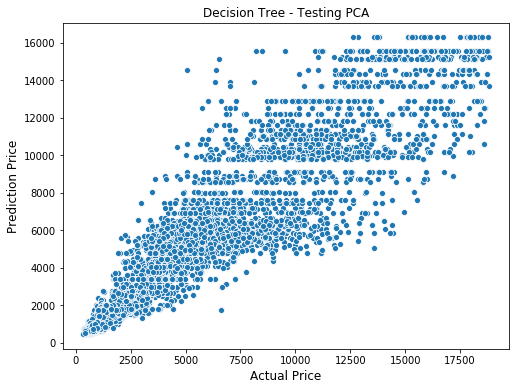

In [116]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_val),y=np.exp(tree_final.predict(X_val)))
# Determine label for horizontal axis
plt.xlabel('Actual Price',fontsize=12)
# Determine label for vertical axis
plt.ylabel('Prediction Price',fontsize=12)
# Title
plt.title('Decision Tree - Testing PCA')

In [117]:
# Predict testing data
y_pred_test = tree_final.predict(X_test)
y_pred_test = np.exp(y_pred_test)

In [118]:
pred_tree_pca = pd.DataFrame({'id':df_test_final.id,'price':y_pred_test})
pred_tree_pca.head()

,id,price
0,36,2476.496068
1,56,6219.385361
2,60,2970.251625
3,94,12866.899246
4,95,503.845233


## 8 Summary

After conducting data modelling with two models and one dimension reduction method, the evaluation are listed below:

| Regression Model | PCA | RMSE Training | RMSE Validation | MAE Training | MAE Validation | Pearson Training | Pearson Validation |
| --- | --- | --- | --- | --- | --- | --- | --- |
| Linear Regression | no | 797.79396 | 775.44049 | 398.54064 | 394.30477 | 0.00000 | 0.00000 |
| Linear Regression | yes | 1483.01031 | 1471.88580 | 808.51382 | 796.20399 | 0.00000 | 0.00000 |
| Decision Tree | no | 613.37038 | 796.16007 | 295.87978 | 360.65011 | 0.00000 | 0.00000 |
| Decision Tree | yes | 1296.01379 | 1344.84880 | 732.18264 | 754.22847 | 0.00000 | 0.00000 |